Exchange rate data  https://www.bot.or.th/thai/_layouts/application/exchangerate/exchangerateago.aspx#

In [ ]:
!gdown --id 1N25wvrUw-9uF8Z9zZeophoF4hpV08U0J
!gdown --id 1H8boJdhaseC-BViPMhRy2IPaOXizIZBW
!gdown --id 1qUb9ccayfvrvhnIqg6XsFQcrsmYYqmeg
!gdown --id 1AC1wMeprnntVYe4hilQm_77w9XjAtZX6
!gdown --id 1yKWlQqcc9ZpqmQUXDS0IVy8TfAUZFgmd

Downloading...
From: https://drive.google.com/uc?id=1N25wvrUw-9uF8Z9zZeophoF4hpV08U0J
To: /content/exrate2017.csv
100% 9.19k/9.19k [00:00<00:00, 14.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1H8boJdhaseC-BViPMhRy2IPaOXizIZBW
To: /content/exrate2018.csv
100% 9.08k/9.08k [00:00<00:00, 7.97MB/s]
Downloading...
From: https://drive.google.com/uc?id=1qUb9ccayfvrvhnIqg6XsFQcrsmYYqmeg
To: /content/exrate2019.csv
100% 9.04k/9.04k [00:00<00:00, 20.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=1AC1wMeprnntVYe4hilQm_77w9XjAtZX6
To: /content/exrate2020.csv
100% 9.15k/9.15k [00:00<00:00, 8.22MB/s]
Downloading...
From: https://drive.google.com/uc?id=1yKWlQqcc9ZpqmQUXDS0IVy8TfAUZFgmd
To: /content/exrate2021.csv
100% 8.89k/8.89k [00:00<00:00, 13.9MB/s]


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import numpy as np

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

from statsmodels.tsa.seasonal import seasonal_decompose

import datetime

%matplotlib inline

# Load Data

In [ ]:
# ดึงข้อมูลจากไฟล์มาไว้ในตัวแปร
import chardet

def load_data():
  li = []

  for i in range(5):
    with open(f'exrate20{17+i}.csv', 'rb') as f:
      encoding = chardet.detect(f.read())

    df = pd.read_csv(f'exrate20{17+i}.csv', encoding=encoding['encoding'], 
                   names = [c.upper() for c in ['Date', 'Sight Bill', 'Transfer', 'Average Selling Rates']], skiprows=1)
    li.append(df)

  frame = pd.concat(li, axis=0, ignore_index=True)
  
  return frame

df = load_data()
df.head()

,DATE,SIGHT BILL,TRANSFER,AVERAGE SELLING RATES
0,19 Aug 2016,34.3537,34.4498,34.7812
1,22 Aug 2016,34.4389,34.5329,34.8614
2,23 Aug 2016,34.3614,34.4572,34.7909
3,24 Aug 2016,34.3896,34.4819,34.8211
4,25 Aug 2016,34.3510,34.4456,34.7821


# Exploratory Data Analysis (EDA)

ตรวจสอบคุณลักษณะของข้อมูล

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1219 entries, 0 to 1218
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   DATE                   1219 non-null   object 
 1   SIGHT BILL             1219 non-null   float64
 2   TRANSFER               1219 non-null   float64
 3   AVERAGE SELLING RATES  1219 non-null   float64
dtypes: float64(3), object(1)
memory usage: 38.2+ KB


In [ ]:
df.describe()

,SIGHT BILL,TRANSFER,AVERAGE SELLING RATES
count,1219.000000,1219.000000,1219.000000
mean,32.009752,32.097721,32.437518
std,1.554614,1.551525,1.552246
min,29.550100,29.642700,29.965300
25%,30.907800,30.996700,31.340100
50%,31.638500,31.724000,32.056200
75%,32.947950,33.029800,33.367250
max,35.764500,35.858000,36.209400


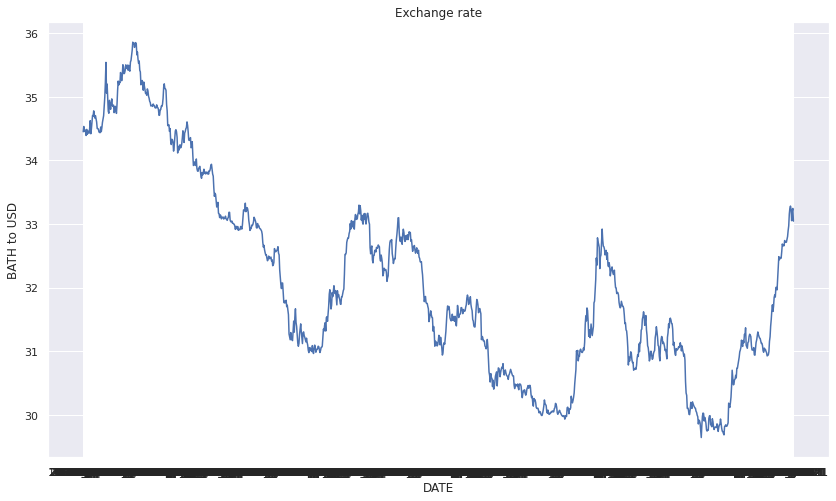

In [ ]:
sns.set(rc={'figure.figsize':(14,8)})
ax = sns.lineplot(data=df, x="DATE", y="TRANSFER")
ax.set_title('Exchange rate')
ax.set_ylabel('BATH to USD');

# Data Preprocessing 

In [ ]:
# แปลงข้อมูล DATE จาก String เป็น Datetime
df.DATE = pd.date_range(start=df.DATE.iloc[0], 
                         periods=len(df.DATE), freq='D')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1219 entries, 0 to 1218
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   DATE                   1219 non-null   datetime64[ns]
 1   SIGHT BILL             1219 non-null   float64       
 2   TRANSFER               1219 non-null   float64       
 3   AVERAGE SELLING RATES  1219 non-null   float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 38.2 KB


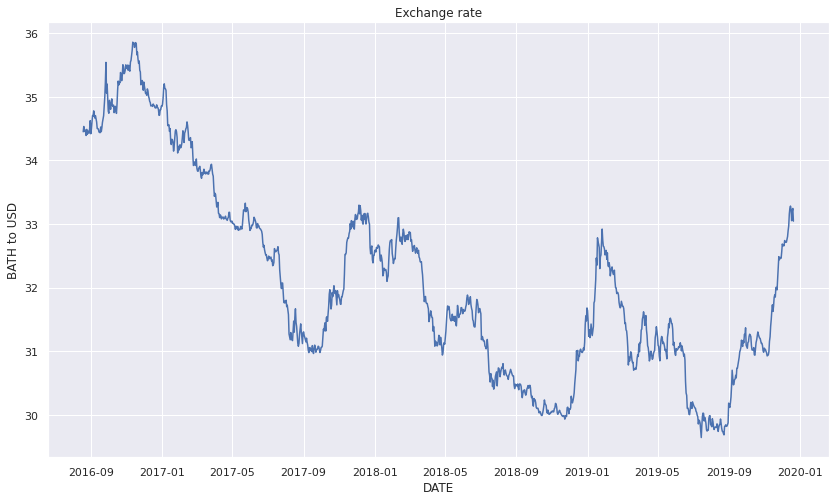

In [ ]:
sns.set(rc={'figure.figsize':(14,8)})
ax = sns.lineplot(data=df, x="DATE", y="TRANSFER")
ax.set_title('Exchange rate')
ax.set_ylabel('BATH to USD');

##Train Test Split

In [ ]:
# แบ่งข้อมูลออกเป็น Trainset และ Testset
def train_test_split(df, train_size):
  train, test = df.iloc[:int(len(df)*train_size)], df.iloc[int(len(df)*train_size):]
  return train, test 

train, test = train_test_split(df, train_size = 0.91)
print('Trainset size :', len(train))
print('Testset size  :', len(test))

Trainset size : 1109
Testset size  : 110


## Feature Extraction

In [ ]:
# นำข้อมูลของวันถัดไป n วันมาต่อเพิ่ม column
def expand_column(df, column_names):
  """
    Parameters
    ----------
    df : pandas.DataFrame
      prediction result dataframe
    column_names : list
      label dataframe

    Returns
    -------
    rmse : float
      root mean square error number
  """

  data_expanded = pd.DataFrame() # กำหนด DataFrame

  for i, name in enumerate(column_names): 
    data_expanded[name] = df['TRANSFER'].shift(-i) # shift up 
    
  data_expanded.dropna(inplace = True)

  return data_expanded

<img src="https://miro.medium.com/max/700/1*lGPAbHRtK1TArAzB_6hzVQ.png"/>

In [ ]:
train.head()

,DATE,SIGHT BILL,TRANSFER,AVERAGE SELLING RATES
0,2016-08-19,34.3537,34.4498,34.7812
1,2016-08-20,34.4389,34.5329,34.8614
2,2016-08-21,34.3614,34.4572,34.7909
3,2016-08-22,34.3896,34.4819,34.8211
4,2016-08-23,34.3510,34.4456,34.7821


In [ ]:
ma25 = train['TRANSFER'].rolling(50).mean()
ma25

0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
          ...    
1104    29.839978
1105    29.839742
1106    29.838880
1107    29.844434
1108    29.849870
Name: TRANSFER, Length: 1109, dtype: float64

In [ ]:
n = 44
column_names = [f"Day{i}" for i in range(n)] + ['Target']

data_week_train = expand_column(train, column_names)
data_week_test = expand_column(test, column_names)
data_week_train.head()

,Day0,Day1,Day2,Day3,Day4,Day5,Day6,Day7,Day8,Day9,Day10,Day11,Day12,Day13,Day14,Day15,Day16,Day17,Day18,Day19,Day20,Day21,Day22,Day23,Day24,Day25,Day26,Day27,Day28,Day29,Day30,Day31,Day32,Day33,Day34,Day35,Day36,Day37,Day38,Day39,Day40,Day41,Day42,Day43,Target
0,34.4498,34.5329,34.4572,34.4819,34.4456,34.3913,34.4871,34.4091,34.4603,34.4549,34.4265,34.4946,34.6237,34.4183,34.4897,34.6051,34.7049,34.6939,34.7784,34.7196,34.6648,34.7028,34.6553,34.6048,34.5010,34.4982,34.4932,34.4470,34.4392,34.4357,34.5243,34.4508,34.5138,34.5964,34.6458,34.7019,34.8527,34.9951,35.2200,35.5406,35.0574,35.2003,34.9965,34.7714,34.7408
1,34.5329,34.4572,34.4819,34.4456,34.3913,34.4871,34.4091,34.4603,34.4549,34.4265,34.4946,34.6237,34.4183,34.4897,34.6051,34.7049,34.6939,34.7784,34.7196,34.6648,34.7028,34.6553,34.6048,34.5010,34.4982,34.4932,34.4470,34.4392,34.4357,34.5243,34.4508,34.5138,34.5964,34.6458,34.7019,34.8527,34.9951,35.2200,35.5406,35.0574,35.2003,34.9965,34.7714,34.7408,34.9438
2,34.4572,34.4819,34.4456,34.3913,34.4871,34.4091,34.4603,34.4549,34.4265,34.4946,34.6237,34.4183,34.4897,34.6051,34.7049,34.6939,34.7784,34.7196,34.6648,34.7028,34.6553,34.6048,34.5010,34.4982,34.4932,34.4470,34.4392,34.4357,34.5243,34.4508,34.5138,34.5964,34.6458,34.7019,34.8527,34.9951,35.2200,35.5406,35.0574,35.2003,34.9965,34.7714,34.7408,34.9438,34.8764
3,34.4819,34.4456,34.3913,34.4871,34.4091,34.4603,34.4549,34.4265,34.4946,34.6237,34.4183,34.4897,34.6051,34.7049,34.6939,34.7784,34.7196,34.6648,34.7028,34.6553,34.6048,34.5010,34.4982,34.4932,34.4470,34.4392,34.4357,34.5243,34.4508,34.5138,34.5964,34.6458,34.7019,34.8527,34.9951,35.2200,35.5406,35.0574,35.2003,34.9965,34.7714,34.7408,34.9438,34.8764,34.8034
4,34.4456,34.3913,34.4871,34.4091,34.4603,34.4549,34.4265,34.4946,34.6237,34.4183,34.4897,34.6051,34.7049,34.6939,34.7784,34.7196,34.6648,34.7028,34.6553,34.6048,34.5010,34.4982,34.4932,34.4470,34.4392,34.4357,34.5243,34.4508,34.5138,34.5964,34.6458,34.7019,34.8527,34.9951,35.2200,35.5406,35.0574,35.2003,34.9965,34.7714,34.7408,34.9438,34.8764,34.8034,34.9027


In [ ]:
data_week_train.head()

,Day0,Day1,Day2,Day3,Day4,Day5,Day6,Day7,Day8,Day9,Day10,Day11,Day12,Day13,Day14,Day15,Day16,Day17,Day18,Day19,Day20,Day21,Day22,Day23,Day24,Day25,Day26,Day27,Day28,Day29,Day30,Day31,Day32,Day33,Day34,Day35,Day36,Day37,Day38,Day39,Day40,Day41,Day42,Day43,Target
0,34.4498,34.5329,34.4572,34.4819,34.4456,34.3913,34.4871,34.4091,34.4603,34.4549,34.4265,34.4946,34.6237,34.4183,34.4897,34.6051,34.7049,34.6939,34.7784,34.7196,34.6648,34.7028,34.6553,34.6048,34.5010,34.4982,34.4932,34.4470,34.4392,34.4357,34.5243,34.4508,34.5138,34.5964,34.6458,34.7019,34.8527,34.9951,35.2200,35.5406,35.0574,35.2003,34.9965,34.7714,34.7408
1,34.5329,34.4572,34.4819,34.4456,34.3913,34.4871,34.4091,34.4603,34.4549,34.4265,34.4946,34.6237,34.4183,34.4897,34.6051,34.7049,34.6939,34.7784,34.7196,34.6648,34.7028,34.6553,34.6048,34.5010,34.4982,34.4932,34.4470,34.4392,34.4357,34.5243,34.4508,34.5138,34.5964,34.6458,34.7019,34.8527,34.9951,35.2200,35.5406,35.0574,35.2003,34.9965,34.7714,34.7408,34.9438
2,34.4572,34.4819,34.4456,34.3913,34.4871,34.4091,34.4603,34.4549,34.4265,34.4946,34.6237,34.4183,34.4897,34.6051,34.7049,34.6939,34.7784,34.7196,34.6648,34.7028,34.6553,34.6048,34.5010,34.4982,34.4932,34.4470,34.4392,34.4357,34.5243,34.4508,34.5138,34.5964,34.6458,34.7019,34.8527,34.9951,35.2200,35.5406,35.0574,35.2003,34.9965,34.7714,34.7408,34.9438,34.8764
3,34.4819,34.4456,34.3913,34.4871,34.4091,34.4603,34.4549,34.4265,34.4946,34.6237,34.4183,34.4897,34.6051,34.7049,34.6939,34.7784,34.7196,34.6648,34.7028,34.6553,34.6048,34.5010,34.4982,34.4932,34.4470,34.4392,34.4357,34.5243,34.4508,34.5138,34.5964,34.6458,34.7019,34.8527,34.9951,35.2200,35.5406,35.0574,35.2003,34.9965,34.7714,34.7408,34.9438,34.8764,34.8034
4,34.4456,34.3913,34.4871,34.4091,34.4603,34.4549,34.4265,34.4946,34.6237,34.4183,34.4897,34.6051,34.7049,34.6939,34.7784,34.7196,34.6648,34.7028,34.6553,34.6048,34.5010,34.4982,34.4932,34.4470,34.4392,34.4357,34.5243,34.4508,34.5138,34.5964,34.6458,34.7019,34.8527,34.9951,35.2200,35.5406,35.0574,35.2003,34.9965,34.7714,34.7408,34.9438,34.8764,34.8034,34.9027


In [ ]:
# แบ่ง Feature และ Label ของทั้ง Trainset และ Testset
feat_train = data_week_train[data_week_train.columns[:-1]]
label_train = data_week_train[data_week_train.columns[-1]]

feat_test = data_week_test[data_week_test.columns[:-1]]
label_test = data_week_test[data_week_test.columns[-1]]

# Train Models

## Machine Learning (Linear Regression)

In [ ]:
# กำหนด Model 
reg = LinearRegression()
# Train model
reg.fit(feat_train, label_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
preds = reg.predict(feat_test)
preds

array([30.94910945, 31.04188434, 31.17485663, 31.18610882, 31.24755473,
       31.30957306, 31.25496291, 31.22302752, 31.23282043, 31.19430302,
       31.16850919, 31.09481544, 31.1085247 , 31.08787419, 30.99145379,
       30.98951733, 31.05392069, 31.02182573, 31.05442158, 30.99811648,
       30.9795719 , 30.90366052, 30.93747559, 30.94339394, 31.00980906,
       31.17259228, 31.23438143, 31.39782792, 31.50898518, 31.6659134 ,
       31.73200181, 31.61699017, 31.71893631, 31.8687999 , 31.89455485,
       31.84184182, 32.02133137, 31.99954505, 31.98346389, 32.14911181,
       32.2967514 , 32.52191917, 32.4434704 , 32.4747458 , 32.48539463,
       32.48009943, 32.59214034, 32.70992121, 32.64577074, 32.68446221,
       32.65777074, 32.74177791, 32.7474418 , 32.72429706, 32.73491918,
       32.75234255, 32.8069415 , 32.92542682, 33.00468628, 33.18371975,
       33.27724553, 33.3073288 , 33.23151855, 33.03647322, 33.20619287,
       33.25034152])

In [ ]:
preds_df = pd.DataFrame({"DATE":test.DATE.values[n-1:-1], "PREDS":preds})

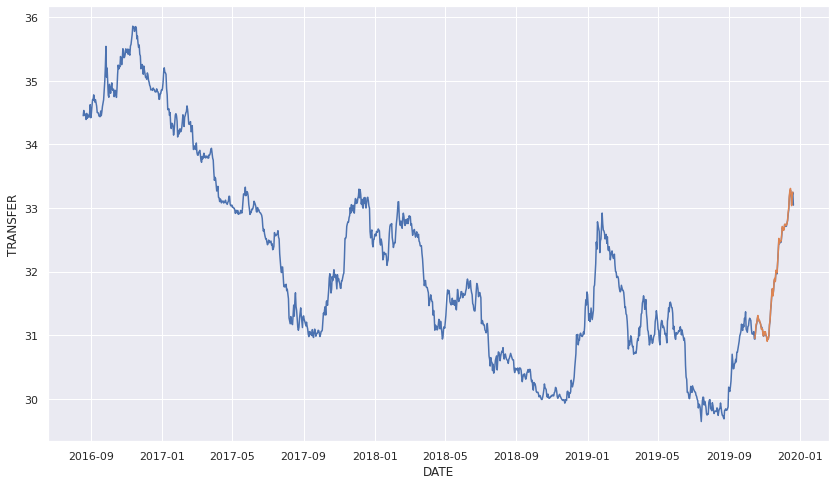

In [ ]:
sns.lineplot(x=df.DATE, y=df['TRANSFER'])
sns.lineplot(x=preds_df.DATE,  y=preds_df.PREDS);

# Evaluate

<img src="https://media.geeksforgeeks.org/wp-content/uploads/20200622171741/RMSE1.jpg"/>

In [ ]:
# วัดผล Prediction กับ Label test
def evaluate_rmse(pred, label):
  """
    Parameters
    ----------
    pred : pandas.DataFrame
      prediction result dataframe
    label : pandas.DataFrame
      label dataframe

    Returns
    -------
    rmse : float
      root mean square error number
  """

  rmse = mean_squared_error(pred, label, squared=True) ** 0.5
  
  return rmse

print('RMSE :', evaluate_rmse(preds, label_test))

RMSE : 0.08290320425267624


# Predict Future Data

In [ ]:
# ทำนายค่าในอนาค
def prediction(reg, feat_train, length): 
  """
    Parameters
    ----------
    feat_train : pandas.DataFrame
      time series input features
    length : int
      length of testset

    Returns
    -------
    result : list
      list of prediction results
  """

  result = []
  inp = feat_train.iloc[-1].to_numpy() # นำข้อมูลวันสุดท้ายของการ Train มาทำนายข้อมูล Test

  for i in range(length): 
    pred = reg.predict(inp.reshape(1, -1))[0] # ทำนายราคาของวันถัดไป
    result.append(pred)
    inp = np.roll(inp,-1) # Shift ข้อมูลไปทางซ้าย 1 ครั้ง
    inp[-1] = pred # นำข้อมูลวันใหม่ไปแทนข้อมูลสุดท้าย

  return result

preds_no = prediction(reg, feat_train, len(test))

<img src="https://www.w3resource.com/w3r_images/numpy-manipulation-roll-function-image-1.png"/>

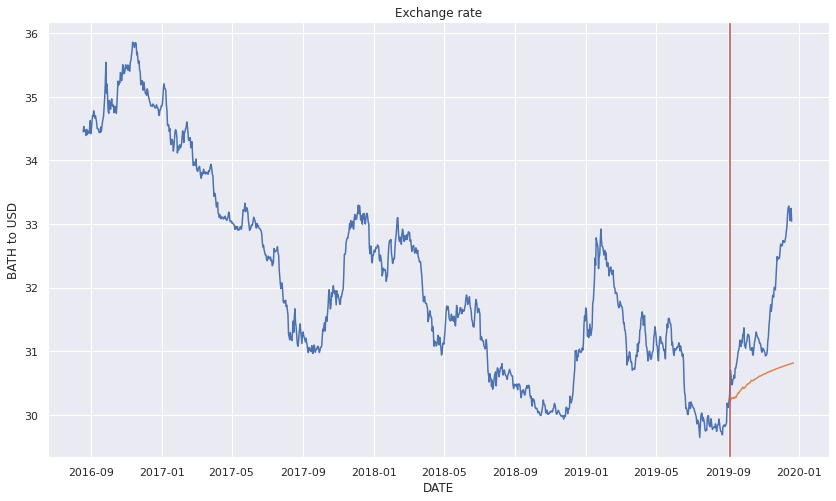

In [ ]:
ax = sns.lineplot(x=df.DATE, y=df['TRANSFER'])
sns.lineplot(x=test.DATE+datetime.timedelta(days=3), y=preds_no);
ax.set_title('Exchange rate')
ax.set_ylabel('BATH to USD');

plt.axvline(test.DATE.iloc[0]+datetime.timedelta(days=3), 0, max(df['TRANSFER'])*1.1, color='r');

In [ ]:
print('RMSE :', evaluate_rmse(preds, df['TRANSFER'][df.DATE > (test.DATE+datetime.timedelta(days=-1)).iloc[0]][:len(preds)]))

RMSE : 1.1885258432341739


# Improve Performance

## Decomposition 

แยกข้อมูล Time series ออกเป็น Trend, Seasonal และ Residual

In [ ]:
def decompose(data):
  """
    Parameters
    ----------
    data : pandas.DataFrame
      raw time series data

    Returns
    -------
    seasonal_n : statsmodels.DecomposeResult
      decomposed result from statsmodels seasonal_decompose
  """

  df_decomposed = data.copy()

  # แปลงให้เหลือ 1 column โดยการนำ column DATE ไปเป็น index
  df_decomposed.index = df_decomposed.DATE  
  df_decomposed = df_decomposed.drop('DATE', axis = 1) 
  
  # แยกองค์ประกอบข้อมูล Time series ออกเป็น Trend, Seasonal และ Residual
  df_decomposed = seasonal_decompose(df_decomposed[['TRANSFER']])

  return df_decomposed

df_decomposed = decompose(train)
df_decomposed.__dict__

{'nobs': 1109, 'observed':             TRANSFER
 DATE                
 2016-08-19   34.4498
 2016-08-20   34.5329
 2016-08-21   34.4572
 2016-08-22   34.4819
 2016-08-23   34.4456
 ...              ...
 2019-08-28   29.8221
 2019-08-29   29.8442
 2019-08-30   29.8736
 2019-08-31   30.1832
 2019-09-01   30.1411
 
 [1109 rows x 1 columns], 'resid':             TRANSFER
 DATE                
 2016-08-19       NaN
 2016-08-20       NaN
 2016-08-21       NaN
 2016-08-22  0.019210
 2016-08-23 -0.004179
 ...              ...
 2019-08-28 -0.059463
 2019-08-29 -0.091517
 2019-08-30       NaN
 2019-08-31       NaN
 2019-09-01       NaN
 
 [1109 rows x 1 columns], 'seasonal':             TRANSFER
 DATE                
 2016-08-19  0.000833
 2016-08-20  0.004318
 2016-08-21  0.006055
 2016-08-22 -0.000995
 2016-08-23 -0.008092
 ...              ...
 2019-08-28 -0.005622
 2019-08-29  0.003503
 2019-08-30  0.000833
 2019-08-31  0.004318
 2019-09-01  0.006055
 
 [1109 rows x 1 columns], 'trend':     

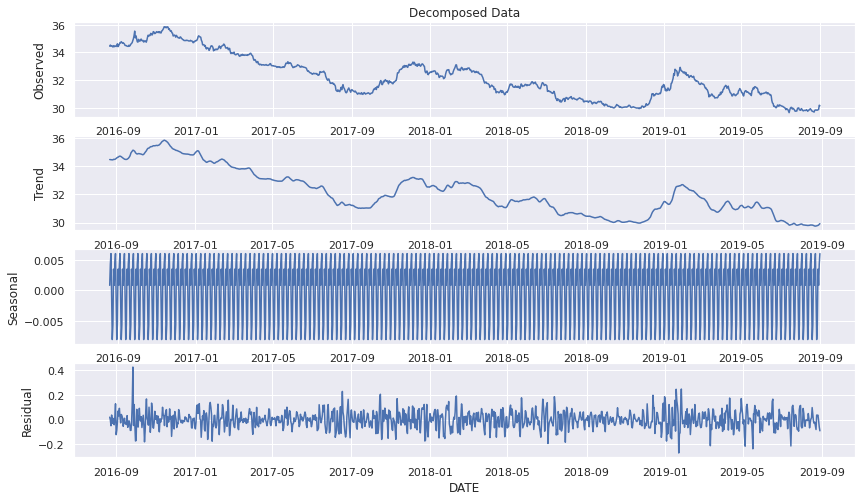

In [ ]:
fig, axs = plt.subplots(nrows=4)
sns.lineplot(x=df_decomposed.observed.index, y=df_decomposed.observed['TRANSFER'], ax=axs[0])
axs[0].set_ylabel('Observed');
sns.lineplot(x=df_decomposed.trend.index, y=df_decomposed.trend['TRANSFER'], ax=axs[1])
axs[1].set_ylabel('Trend');
sns.lineplot(x=df_decomposed.seasonal.index, y=df_decomposed.seasonal['TRANSFER'], ax=axs[2])
axs[2].set_ylabel('Seasonal');
sns.lineplot(x=df_decomposed.resid.index, y=df_decomposed.resid['TRANSFER'], ax=axs[3]);
axs[3].set_ylabel('Residual');

axs[0].set_title('Decomposed Data');

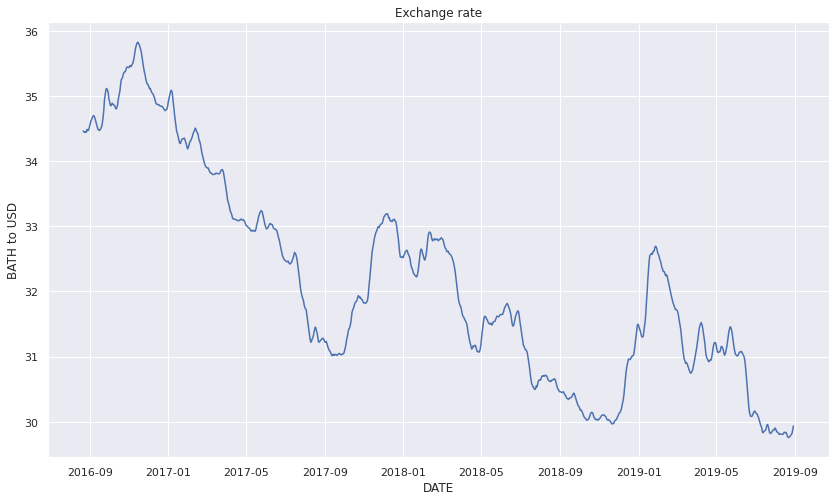

In [ ]:
sns.set(rc={'figure.figsize':(14,8)})
ax = sns.lineplot(data = df_decomposed.seasonal + df_decomposed.trend, x = "DATE", y = 'TRANSFER')
ax.set_title('Exchange rate')
ax.set_ylabel('BATH to USD');

In [ ]:
# นำข้อมูลจำนวน n วันมาเพิ่มเป็น column
data_trend_train = expand_column(df_decomposed.trend, column_names)

# แบ่ง Feature และ Label
feat_trend_train = data_trend_train[data_trend_train.columns[:-1]]
label_trend_train = data_trend_train[data_trend_train.columns[-1]]

## Train Model

In [ ]:
# กำหนด Model
reg = LinearRegression()
# Train model
reg.fit(feat_trend_train, label_trend_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

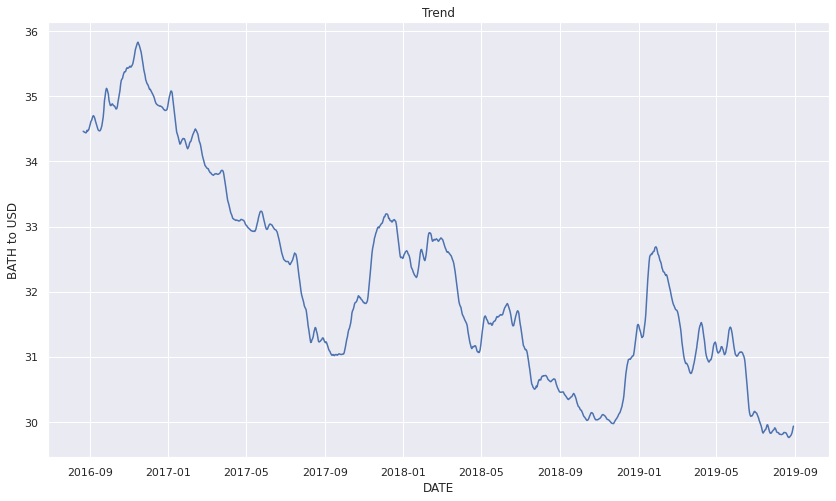

In [ ]:
ax = sns.lineplot(x=df_decomposed.trend.index, y=df_decomposed.trend['TRANSFER']);
ax.set_ylabel('BATH to USD');
ax.set_title('Trend');

In [ ]:
preds = reg.predict(feat_trend_train)
preds[:10]

array([34.88436458, 34.89427268, 34.87375481, 34.88268023, 34.83193929,
       34.84083362, 34.82542074, 34.81151217, 34.79325081, 34.81280303])

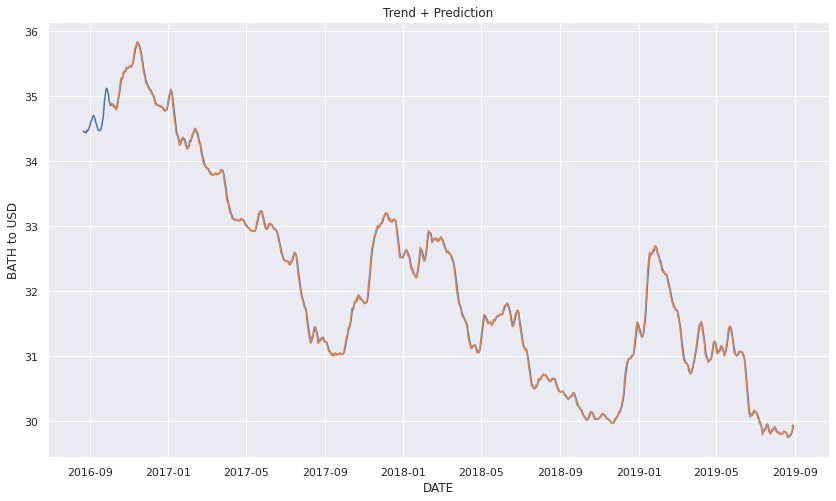

In [ ]:
ax = sns.lineplot(x=df_decomposed.trend.index, y=df_decomposed.trend['TRANSFER'])
plt.plot(df_decomposed.trend.index[n+2:len(preds)+n+2], preds);
ax.set_ylabel('BATH to USD');
ax.set_title('Trend + Prediction');

## Prediction

In [ ]:
feat_trend_train.head()

,Day0,Day1,Day2,Day3,Day4,Day5,Day6,Day7,Day8,Day9,Day10,Day11,Day12,Day13,Day14,Day15,Day16,Day17,Day18,Day19,Day20,Day21,Day22,Day23,Day24,Day25,Day26,Day27,Day28,Day29,Day30,Day31,Day32,Day33,Day34,Day35,Day36,Day37,Day38,Day39,Day40,Day41,Day42,Day43
DATE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-08-22,34.463686,34.457871,34.447500,34.447171,34.439257,34.446257,34.479457,34.469629,34.481143,34.501829,34.537543,34.575743,34.616286,34.629986,34.665200,34.695643,34.702814,34.688514,34.660957,34.620929,34.588586,34.557471,34.519814,34.488443,34.476943,34.469771,34.472000,34.486743,34.515143,34.552671,34.612243,34.679500,34.789386,34.936071,35.001929,35.081143,35.123229,35.111614,35.075286,35.035829,34.940943,34.904657,34.862143,34.857914
2016-08-23,34.457871,34.447500,34.447171,34.439257,34.446257,34.479457,34.469629,34.481143,34.501829,34.537543,34.575743,34.616286,34.629986,34.665200,34.695643,34.702814,34.688514,34.660957,34.620929,34.588586,34.557471,34.519814,34.488443,34.476943,34.469771,34.472000,34.486743,34.515143,34.552671,34.612243,34.679500,34.789386,34.936071,35.001929,35.081143,35.123229,35.111614,35.075286,35.035829,34.940943,34.904657,34.862143,34.857914,34.870429
2016-08-24,34.447500,34.447171,34.439257,34.446257,34.479457,34.469629,34.481143,34.501829,34.537543,34.575743,34.616286,34.629986,34.665200,34.695643,34.702814,34.688514,34.660957,34.620929,34.588586,34.557471,34.519814,34.488443,34.476943,34.469771,34.472000,34.486743,34.515143,34.552671,34.612243,34.679500,34.789386,34.936071,35.001929,35.081143,35.123229,35.111614,35.075286,35.035829,34.940943,34.904657,34.862143,34.857914,34.870429,34.885857
2016-08-25,34.447171,34.439257,34.446257,34.479457,34.469629,34.481143,34.501829,34.537543,34.575743,34.616286,34.629986,34.665200,34.695643,34.702814,34.688514,34.660957,34.620929,34.588586,34.557471,34.519814,34.488443,34.476943,34.469771,34.472000,34.486743,34.515143,34.552671,34.612243,34.679500,34.789386,34.936071,35.001929,35.081143,35.123229,35.111614,35.075286,35.035829,34.940943,34.904657,34.862143,34.857914,34.870429,34.885857,34.875171
2016-08-26,34.439257,34.446257,34.479457,34.469629,34.481143,34.501829,34.537543,34.575743,34.616286,34.629986,34.665200,34.695643,34.702814,34.688514,34.660957,34.620929,34.588586,34.557471,34.519814,34.488443,34.476943,34.469771,34.472000,34.486743,34.515143,34.552671,34.612243,34.679500,34.789386,34.936071,35.001929,35.081143,35.123229,35.111614,35.075286,35.035829,34.940943,34.904657,34.862143,34.857914,34.870429,34.885857,34.875171,34.857143


In [ ]:
# ทำนายผลวันถัดไป
preds_decomposed = prediction(reg, feat_trend_train, len(test))
preds_decomposed[:10]

[29.942183222073574,
 29.9893813217626,
 30.038641135408692,
 30.08865754091756,
 30.138832557785314,
 30.182869062499332,
 30.193486564747328,
 30.20179718524515,
 30.21372787467773,
 30.221570711639526]

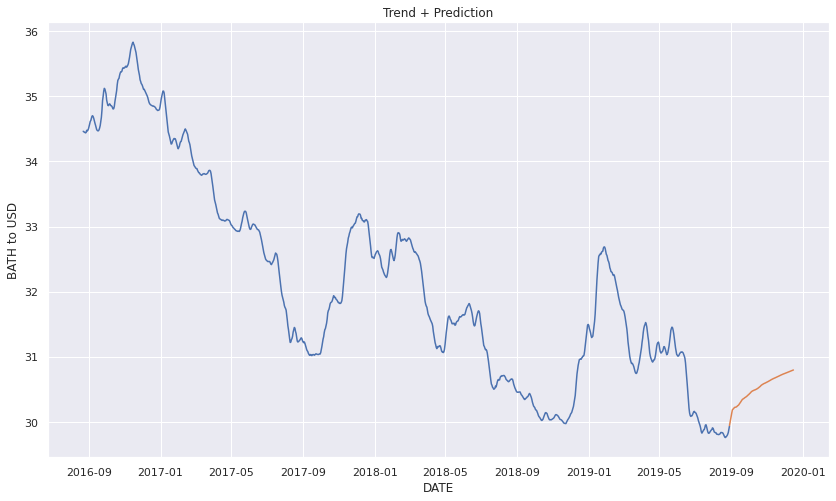

In [ ]:
date_list = pd.date_range(df_decomposed.trend.index[-n+40], periods=len(test), freq='D').tolist()

ax = sns.lineplot(x=df_decomposed.trend.index, y=df_decomposed.trend['TRANSFER'])
plt.plot(date_list, preds_decomposed)
ax.set_ylabel('BATH to USD')
ax.set_title('Trend + Prediction');

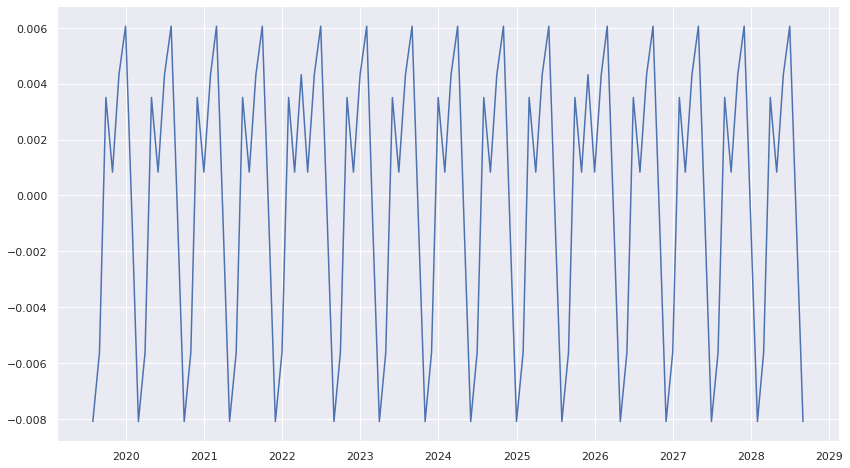

In [ ]:
# ขยายขนาดของ Seasonal ให้ครอบคลุม Testset
def expand_seasonal(seasonal, n, length):
  """
    Parameters
    ----------
    seasonal : pandas.DataFrame
      seasonal dataframe from seasonal decompostion
    n : int
      seasonal range
    length : int
      expected expand size

    Returns
    -------
    seasonal_n : pandas.DataFrame
      expanded seasonal dataframe
  """

  seasonal_n = seasonal[:n] # แยก seasonal ช่วงแรกออกมาก

  for i in range(2*n,len(seasonal),n): # นำ seasonal ทุก ๆ ช่วงมาบวกกันทั้งหมด
      seasonal_n += seasonal[:i] 

  seasonal_mean = seasonal_n/(len(seasonal)//n) # หารเฉลี่ย seasonal 

  r = length//n + 1 # จำนวนช่วงของ seasonal ที่จำเป็นให้ครอบคลุมขนาดของ Testset
  
  temp = seasonal_mean.copy()
  for i in range(r): # นำช่วง seasonal มาต่อกันจำครอบคลุมขนาดของ Testset
    seasonal_mean = seasonal_mean.append(temp)
  
  st = len(train.DATE.iloc[:-n+2])%n # หาจุดสุดท้ายของ Trainset seasonal

  # เลือก seasonal ให้เริ่มต้นที่ตำแหน่งถัดจาก seasonal สุดท้ายของ Trainset
  seasonal_mean = seasonal_mean.iloc[st:length + st] 

  seasonal_mean.index = pd.date_range(train.DATE.iloc[-n+2], periods=length, freq='MS').tolist()

  return seasonal_mean

pred_seasonal = expand_seasonal(df_decomposed.seasonal, n, len(test))
plt.plot(pred_seasonal);

In [ ]:
# นำผลลัพท์จากการทำนามาบวกกับ seasonal 
result_de = pred_seasonal.to_numpy().T[0] + np.array(preds_decomposed)
result_de[:10]

array([29.9340908 , 29.98375906, 30.0421441 , 30.08949073, 30.14315083,
       30.18892455, 30.19249134, 30.19370476, 30.20810561, 30.22507368])

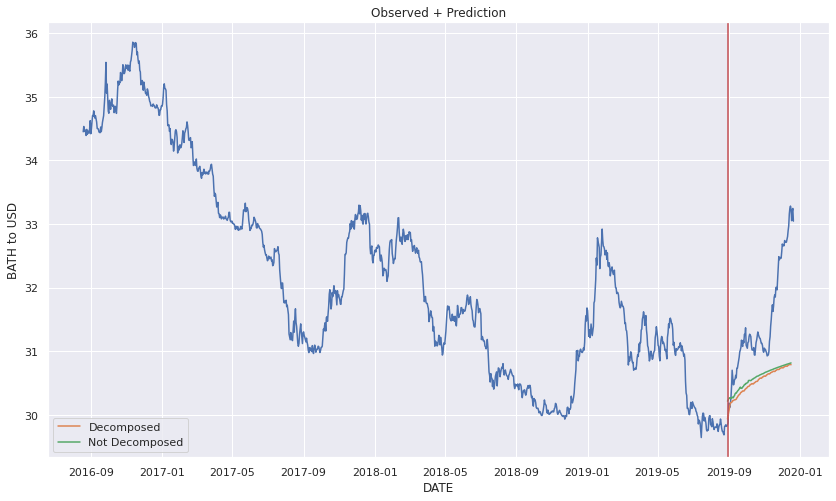

In [ ]:
date_list = pd.date_range(train.DATE.iloc[-n+40], periods=len(test), freq='D').tolist()

ax = sns.lineplot(x=train.DATE.append(test.DATE), y=train['TRANSFER'].append(test['TRANSFER']))
plt.plot(date_list, result_de, label="Decomposed");
plt.plot(date_list, preds_no, label="Not Decomposed");

plt.axvline(train.DATE.iloc[-n+40], 0, max(df['TRANSFER'])*1.1, color='r')
plt.legend()

ax.set_ylabel('BATH to USD')
ax.set_title('Observed + Prediction');

In [ ]:
print('RMSE :', evaluate_rmse(result_de, df['TRANSFER'][df.DATE >(test.DATE+datetime.timedelta(days=-1)).iloc[0]][:len(result_de)]))

RMSE : 1.1973240532457226


# Pipeline

In [ ]:
def pipeline(decomposed = True, n=12):
  
  # load data
  df = load_data()

  # preprocessing
  df.DATE = pd.date_range(start=df.DATE.iloc[0], 
                         periods=len(df.DATE), freq='D')

  # train test split
  train, test = train_test_split(df, train_size = 0.91)

  column_names = [f"Day{i}" for i in range(n)] + ['Target']
  # seasonal decomposition
  if decomposed:
    train_de = decompose(train)

    # feature extraction
    data_week_train = expand_column(train_de.trend, column_names)
    data_week_test = expand_column(test, column_names)

    pred_seasonal = expand_seasonal(train_de.seasonal, n, len(test))

  else:
    data_week_train = expand_column(train, column_names)
    data_week_test = expand_column(test, column_names)

  feat_train = data_week_train[data_week_train.columns[:-1]]
  label_train = data_week_train[data_week_train.columns[-1]]

  feat_test = data_week_test[data_week_test.columns[:-1]]
  label_test = data_week_test[data_week_test.columns[-1]]

  # train model
  reg = LinearRegression()
  reg.fit(feat_train, label_train)

  # prediction
  preds = prediction(reg, feat_train, len(test))
 
  if decomposed:
    preds = pred_seasonal.to_numpy().T[0] + np.array(preds)
    # evaluate
    rmse = evaluate_rmse(preds, df['TRANSFER'][df.DATE > (test.DATE+datetime.timedelta(days=-1)).iloc[0]][:len(preds)])
    print('RMSE :', rmse)
  else: 
    rmse = evaluate_rmse(preds, df['TRANSFER'][df.DATE > (test.DATE+datetime.timedelta(days=-1)).iloc[0]][:len(preds)])
    print('RMSE :', rmse)

  return preds, rmse

In [ ]:
result = pipeline(decomposed = True, n=44)

RMSE : 1.1973240532457226


In [ ]:
result = pipeline(decomposed = False, n=44)

RMSE : 1.1596110209834547


In [ ]:
n = 200
rmses = []
rmse_decomposeds = []
for i in range(4, n, 4):
  _, rmse = pipeline(decomposed = False, n=i+1)
  _, rmse_decomposed = pipeline(decomposed = True, n=i+1)
  rmses.append(rmse)
  rmse_decomposeds.append(rmse_decomposed)

RMSE : 1.4371505304731131
RMSE : 1.5560469611051797
RMSE : 1.4525225950924139
RMSE : 1.3406291045182415
RMSE : 1.4440728803883545
RMSE : 1.4789270129582903
RMSE : 1.396487951596158
RMSE : 1.257210275596454
RMSE : 1.282450570927647
RMSE : 1.4326382402544042
RMSE : 1.2652365961296757
RMSE : 1.2918879545041428
RMSE : 1.256550481802131
RMSE : 1.3503573847303847
RMSE : 1.210504065953851
RMSE : 1.1982336202754265
RMSE : 1.2115599982029472
RMSE : 1.1678722565700603
RMSE : 1.1646854673258447
RMSE : 1.2209348891252017
RMSE : 1.183910510285661
RMSE : 1.2146612207828658
RMSE : 1.2166164294911015
RMSE : 1.268283120850109
RMSE : 1.172184473841545
RMSE : 1.288474223212066
RMSE : 1.210293817210275
RMSE : 1.3361341151905535
RMSE : 1.2531300675587702
RMSE : 1.3707539378650304
RMSE : 1.343714740054767
RMSE : 1.3086143309327014
RMSE : 1.313159163585142
RMSE : 1.3507210372540512
RMSE : 1.3019595383913736
RMSE : 1.3385783419812791
RMSE : 1.318552268170005
RMSE : 1.3374075749905892
RMSE : 1.3202653319541295

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

df_rmse = pd.DataFrame({"#Previous days":range(4, n, 4), "RMSE":rmses})
df_rmse_decomposed = pd.DataFrame({"#Previous days":range(4, n, 4), "RMSE":rmse_decomposeds})
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_rmse["#Previous days"], y=df_rmse["RMSE"], mode="lines", name="No Decomposed"))
fig.add_trace(go.Scatter(x=df_rmse_decomposed["#Previous days"], y=df_rmse_decomposed["RMSE"], mode="lines", name="Decomposed"))
fig.show()

In [ ]:
print("Best #Previous days: ", np.argmin(rmses)*4 + 4)

Best #Previous days:  40


# **LSTM**

In [ ]:
df = load_data()
df.DATE = pd.date_range(start=df.DATE.iloc[0], 
                         periods=len(df.DATE), freq='D')
df.head()

,DATE,SIGHT BILL,TRANSFER,AVERAGE SELLING RATES
0,2016-08-19,34.3537,34.4498,34.7812
1,2016-08-20,34.4389,34.5329,34.8614
2,2016-08-21,34.3614,34.4572,34.7909
3,2016-08-22,34.3896,34.4819,34.8211
4,2016-08-23,34.3510,34.4456,34.7821


In [ ]:
training_set = df[['TRANSFER']].values
training_set

array([[34.4498],
       [34.5329],
       [34.4572],
       ...,
       [33.1973],
       [33.2447],
       [33.0443]])

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
sc = MinMaxScaler(feature_range = (0, 1))
training_set_scaled = sc.fit_transform(training_set)

In [ ]:
x = np.array([2100, 2200, 1500])
((x - x.min())/(x.max() - x.min())) * ((x.max() - x.min())) + x.min()



array([2100., 2200., 1500.])

In [ ]:
num_prev = 60

X_train = []
y_train = []

for i in range(num_prev, len(training_set)):
    X_train.append(training_set_scaled[i-num_prev:i, 0])
    y_train.append(training_set_scaled[i, 0])
X_train, y_train = np.array(X_train), np.array(y_train)

X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))

In [ ]:
import tensorflow as tf
tf.random.set_seed(1)
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout

regressor = Sequential()
regressor.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
regressor.add(Dropout(0.2))
regressor.add(LSTM(units = 50, return_sequences = True))
regressor.add(Dropout(0.2))
regressor.add(LSTM(units = 50, return_sequences = True))
regressor.add(Dropout(0.2))
regressor.add(LSTM(units = 50))
regressor.add(Dropout(0.2))
regressor.add(Dense(units = 1)) 

In [ ]:
%load_ext tensorboard
#%reload_ext tensorboard
%tensorboard --logdir=mylogs --reload_multifile True

Reusing TensorBoard on port 6006 (pid 151), started 0:14:02 ago. (Use '!kill 151' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
import os
regressor.compile(optimizer = 'adam', loss = 'mean_squared_error')

logdir = os.path.join("mylogs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
  
regressor.fit(X_train, y_train, epochs = 50, batch_size = 32, callbacks=[tensorboard_callback])

Epoch 1/50
37/37 [==============================] - 6s 38ms/step - loss: 0.0346
Epoch 2/50
37/37 [==============================] - 0s 13ms/step - loss: 0.0080
Epoch 3/50
37/37 [==============================] - 0s 13ms/step - loss: 0.0064
Epoch 4/50
37/37 [==============================] - 0s 13ms/step - loss: 0.0053
Epoch 5/50
37/37 [==============================] - 1s 14ms/step - loss: 0.0045
Epoch 6/50
37/37 [==============================] - 0s 14ms/step - loss: 0.0055
Epoch 7/50
37/37 [==============================] - 0s 13ms/step - loss: 0.0049
Epoch 8/50
37/37 [==============================] - 0s 13ms/step - loss: 0.0042
Epoch 9/50
37/37 [==============================] - 1s 14ms/step - loss: 0.0038
Epoch 10/50
37/37 [==============================] - 0s 13ms/step - loss: 0.0040
Epoch 11/50
37/37 [==============================] - 0s 13ms/step - loss: 0.0046
Epoch 12/50
37/37 [==============================] - 1s 14ms/step - loss: 0.0037
Epoch 13/50
37/37 [==================

In [ ]:
d = 0
future = len(test)-d
result = []
q = X_train[None,-future]
for i in range(future):
  pred = regressor.predict(q)
  result.append(pred)
  q = np.roll(q, -1, axis=1)
  q[-1] = pred

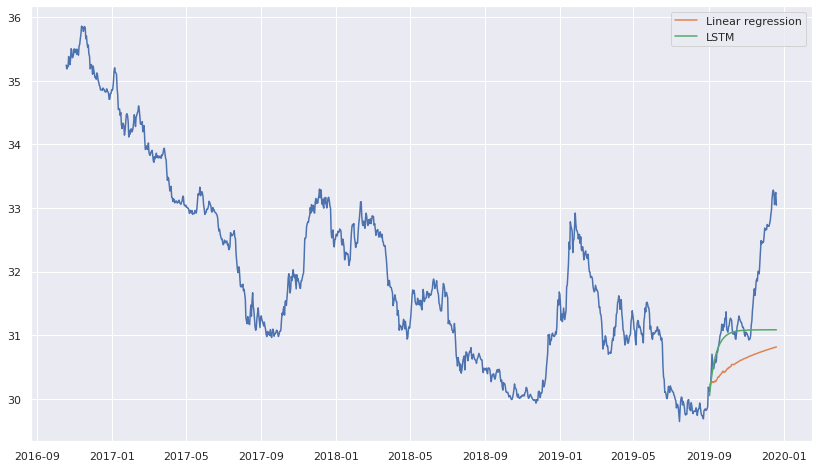

In [ ]:
plt.plot(df.DATE[60:], sc.inverse_transform(y_train.reshape(-1, 1)))
plt.plot(df.DATE[-future:], np.array(preds_no), label="Linear regression")
plt.plot(df.DATE[-future:] , sc.inverse_transform(np.array(result)[:,:,0]), label="LSTM")
plt.legend();